# LSTM model with cartesian coordinates lambda=1

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv1D, Flatten, Dense, Input, concatenate, Masking, LSTM, Bidirectional
from tensorflow.keras import regularizers 
from tensorflow.keras import initializers
import tensorflow.keras.backend as K
import h5py 
import os 
import kerastuner as kt 
import IPython 
os.environ["CUDA_VISIBLE_DEVICES"]="0"


%matplotlib inline 

dataset = h5py.File('./../../../../../data/hongtao/variables_tt_re2.h5','r')

X_keys = ['j1_pt', 'j1_eta', 'j1_phi', 'j1_m', 'j1_DL1r', 'j2_pt', 'j2_eta', 'j2_phi', 'j2_m', 'j2_DL1r', 'j3_pt', 'j3_eta', 'j3_phi', 'j3_m', 'j3_DL1r', 'j4_pt', 'j4_eta', 'j4_phi', 'j4_m', 'j4_DL1r', 'j5_pt', 'j5_eta', 'j5_phi', 'j5_m', 'j5_DL1r', 'j6_pt', 'j6_eta', 'j6_phi', 'j6_m', 'j6_DL1r', 'lep_pt', 'lep_eta', 'lep_phi', 'met_met', 'met_phi']
Y_keys = ['th_pt', 'th_eta','th_phi', 'tl_pt', 'tl_eta', 'tl_phi', 'wl_pt', 'wl_eta', 'wl_phi']
phi_keys = ['j1_phi', 'j2_phi', 'j3_phi','j4_phi','j5_phi','j6_phi', 'lep_phi', 'met_phi', 'th_phi', 'tl_phi', 'wl_phi']
eta_keys = ['j1_eta', 'j2_eta', 'j3_eta', 'j4_eta', 'j5_eta', 'j5_phi', 'j6_eta', 'lep_eta', 'th_eta', 'tl_eta', 'wl_eta']
pt_keys = ['j1_pt', 'j2_pt','j3_pt','j4_pt','j5_pt','j6_pt','lep_pt','th_pt', 'tl_pt', 'wl_pt']
m_keys = ['j1_m','j2_m', 'j3_m', 'j4_m', 'j5_m', 'j6_m', 'wl_m']
DL1r_keys = ['j1_DL1r','j2_DL1r','j3_DL1r','j4_DL1r','j5_DL1r','j6_DL1r']


Y_length = len(Y_keys)
X_length = len(X_keys)
crop0 =  500000 

In [2]:
import scale_variables
import shape_timesteps

# How to scale each input/output
def get_methods(keys):
    types = {'pt':'cart_pt', 'eta':'meanmax', 'phi':'sincos', 'DL1r':'meanmax', 'm':'boxcox', 'met':'meanmax'}
    var_types = [key.split('_')[1] for key in keys]
    methods = [types[var] for var in var_types]
    return methods

X_methods = get_methods(X_keys)
Y_methods = get_methods(Y_keys)

Scaler = scale_variables.Scale_variables()
(X_total, X_maxmean), X_names = Scaler.scale_arrays(X_keys, X_methods, True)
(Y_total, Y_maxmean), Y_names = Scaler.scale_arrays(Y_keys, Y_methods, True)

error = Scaler.test_inverse(Y_keys, Y_methods, True)
print('Max scaling error: {}'.format(error))

Max scaling error: 3.410605131648481e-13


In [3]:
# Create X and test array
split = int(np.floor(0.9*crop0)) # 80/20 split 

trainY, testY = Y_total[0:split,:], Y_total[split:,:]

timestep_builder = shape_timesteps.Shape_timesteps()
totalX_jets, totalX_other = timestep_builder.reshape_X(X_total, X_names, False,True)

trainX_jets, testX_jets = totalX_jets[0:split,:,:], totalX_jets[split:,:,:]
trainX_other, testX_other = totalX_other[0:split,:], totalX_other[split:,:]

# Save some memory 
del totalX_jets
del totalX_other 

print(trainX_jets.shape, trainX_other.shape, trainY.shape)
print(testX_jets.shape, testX_other.shape, testY.shape)

(450000, 6, 6) (450000, 7) (450000, 12)
(50000, 6, 6) (50000, 7) (50000, 12)


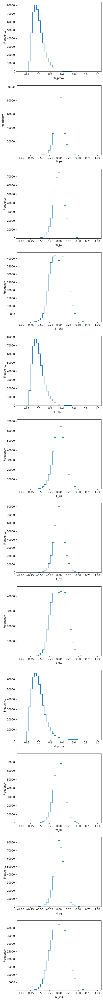

In [4]:
# Histograms of total  Y variables 
show = True

other_bins = np.linspace(-1, 1, 40)
phi_bins = np.linspace(-0.1, 0.1, 40)
pt_bins = np.linspace(-0.3, 1, 40)
Y_bins = [phi_bins if 'phi' in name else pt_bins if 'pt' in name else other_bins for name in Y_names]

if show:
    plt.figure(figsize=(6,6*trainY.shape[1]))
    for i in range(0, trainY.shape[1]):
        plt.subplot(trainY.shape[1], 1, i+1)
        bins = Y_bins[i]
        plt.hist(Y_total[:,i], bins, histtype='step')
        plt.xlabel(Y_names[i])
        plt.ylabel('Frequency')

In [5]:
# Histograms of X variables (without the mask)
show = False

if show:
    plt.figure(figsize=(6,6*X_total.shape[1]))
    for i in range(0, X_total.shape[1]):
        plt.subplot(X_total.shape[1], 1, i+1)
        plt.hist(X_total[:,i], 40, histtype='step')
        plt.xlabel(X_names[i])
        plt.ylabel('Frequency')

 

# Reweight events to be flat in some area 

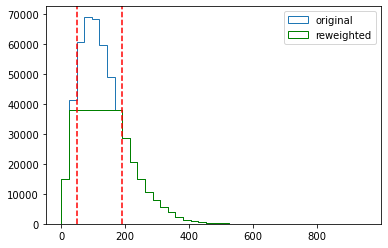

In [6]:
th_pt = np.array(dataset.get('th_pt'))[0:crop0]
hist1, bins = np.histogram(th_pt, 40)
hist1 = hist1 + (hist1<=0)*1
bins[-1] = np.inf
plt.hist(th_pt, 40, histtype='step', label='original')
argright = 8
argleft = 2
right = bins[argright]
left = bins[argleft]
compare_min = hist1[argright-1]
plt.axvline(x=left, color='r', linestyle='--')
plt.axvline(x=right, color='r', linestyle='--')
flat = 1
belong = np.digitize(th_pt, bins) - 1
factor = compare_min/hist1*(hist1>=compare_min) + (hist1<compare_min)
weight = factor[belong]
plt.hist(th_pt, bins, histtype='step', label='reweighted', color='g', weights=weight)
plt.legend()

In [7]:
# Build model

def build_model(hp):
    jet_input = Input(shape=(trainX_jets.shape[1], trainX_jets.shape[2]))
    Mask = Masking(-2)(jet_input)
    LSTM11 = LSTM(hp.Int('input_units', min_value=32, max_value=256, step=32), return_sequences=True)(Mask)
    for i in range(hp.Int('n_layersLSTM1', 1,3)):
        LSTM11 = LSTM(hp.Int('input_units', min_value=32, max_value=256, step=32), return_sequences=True)(LSTM11)
    flat_jets = Flatten()(LSTM11)

    other_input = Input(shape=(trainX_other.shape[1]))
    Dense21 = Dense(hp.Int('input_units', min_value=32, max_value=256, step=32),activation='relu')(other_input)
    for i in range(hp.Int('n_layersDense2', 1,3)):
        Dense21 = Dense(hp.Int('input_units', min_value=32, max_value=256, step=32),activation='relu')(Dense21)
    flat_other = Flatten()(Dense21)
    
    Dense1 = concatenate([flat_other, flat_jets])
    for i in range(hp.Int('n_layersDense1', 1,3)):
        Dense1 = Dense(hp.Int('input_units', min_value=32, max_value=420, step=32),activation='relu')(Dense1)
    output = Dense(len(Y_names), activation='linear')(Dense1)
    model = keras.models.Model(inputs=[jet_input, other_input], outputs=output)
    optimizer = keras.optimizers.Adam(learning_rate=hp.Choice('learning_rate', values=[1e-4,5e-5,2.5e-5,1e-5,5e-6,1e-6]))
    model.compile(loss='mse', optimizer= optimizer, metrics=['mse'])
    
    return model

tuner = kt.Hyperband(build_model,
                     objective = 'val_mse', 
                     max_epochs = 10,
                     factor = 3,
                     directory = './tuners',
                     project_name = 'LSTMcart_parasearch')  

INFO:tensorflow:Reloading Oracle from existing project ./tuners/LSTMcart_parasearch/oracle.json
INFO:tensorflow:Reloading Tuner from ./tuners/LSTMcart_parasearch/tuner0.json


In [8]:
class ClearTrainingOutput(tf.keras.callbacks.Callback):
    def on_train_end(*args, **kwargs):
        IPython.display.clear_output(wait = True)

tuner.search([trainX_jets, trainX_other], trainY, epochs = 10, validation_data = ([testX_jets, testX_other], testY), callbacks = [ClearTrainingOutput()])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

# print(f"""
# The hyperparameter search is complete. The optimal number of units in the first densely-connected
# layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
# is {best_hps.get('learning_rate')}.
# """)

INFO:tensorflow:Oracle triggered exit


In [9]:
model = tuner.hypermodel.build(best_hps)

K.set_value(model.optimizer.learning_rate, 1e-5)
print("Learning rate: {}".format(K.eval(model.optimizer.lr)))
model.summary()

Learning rate: 9.999999747378752e-06
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 6, 6)]       0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 7)]          0                                            
__________________________________________________________________________________________________
masking (Masking)               (None, 6, 6)         0           input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 160)          1280        input_2[0][0]                    
_________________________________________________________

In [10]:
# Build the model with the optimal hyperparameters and train it on the data



callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
Epochs= 512
history = model.fit([trainX_jets, trainX_other], trainY, verbose=1, epochs=Epochs, 
                   validation_data=([testX_jets, testX_other], testY), shuffle=False, callbacks=[callback],
                   batch_size=512)

Train on 450000 samples, validate on 50000 samples
Epoch 1/512


211456/450000 [=============>................] - ETA: 3:12:09 - loss: 0.0225 - mse: 0.02 - ETA: 1:04:09 - loss: 0.0226 - mse: 0.02 - ETA: 38:33 - loss: 0.0228 - mse: 0.0228 - ETA: 27:36 - loss: 0.0226 - mse: 0.02 - ETA: 21:30 - loss: 0.0228 - mse: 0.02 - ETA: 17:37 - loss: 0.0228 - mse: 0.02 - ETA: 14:56 - loss: 0.0229 - mse: 0.02 - ETA: 12:58 - loss: 0.0230 - mse: 0.02 - ETA: 11:28 - loss: 0.0229 - mse: 0.02 - ETA: 10:16 - loss: 0.0229 - mse: 0.02 - ETA: 9:19 - loss: 0.0230 - mse: 0.0230 - ETA: 8:31 - loss: 0.0229 - mse: 0.022 - ETA: 7:51 - loss: 0.0229 - mse: 0.022 - ETA: 7:17 - loss: 0.0229 - mse: 0.022 - ETA: 6:47 - loss: 0.0229 - mse: 0.022 - ETA: 6:22 - loss: 0.0228 - mse: 0.022 - ETA: 5:59 - loss: 0.0228 - mse: 0.022 - ETA: 5:39 - loss: 0.0228 - mse: 0.022 - ETA: 5:21 - loss: 0.0228 - mse: 0.022 - ETA: 5:05 - loss: 0.0227 - mse: 0.022 - ETA: 4:51 - loss: 0.0227 - mse: 0.022 - ETA: 4:38 - loss: 0.0227 - mse: 0.022 - ETA: 4:26 - loss: 0.0227 - mse: 0.022 - ETA: 4:15 - loss: 0.0227

431616/450000 [===========================>..] - ETA: 27s - loss: 0.0201 - mse: 0.02 - ETA: 27s - loss: 0.0201 - mse: 0.02 - ETA: 27s - loss: 0.0201 - mse: 0.02 - ETA: 27s - loss: 0.0200 - mse: 0.02 - ETA: 27s - loss: 0.0200 - mse: 0.02 - ETA: 26s - loss: 0.0200 - mse: 0.02 - ETA: 26s - loss: 0.0200 - mse: 0.02 - ETA: 26s - loss: 0.0200 - mse: 0.02 - ETA: 26s - loss: 0.0199 - mse: 0.01 - ETA: 26s - loss: 0.0199 - mse: 0.01 - ETA: 26s - loss: 0.0199 - mse: 0.01 - ETA: 25s - loss: 0.0199 - mse: 0.01 - ETA: 25s - loss: 0.0199 - mse: 0.01 - ETA: 25s - loss: 0.0198 - mse: 0.01 - ETA: 25s - loss: 0.0198 - mse: 0.01 - ETA: 25s - loss: 0.0198 - mse: 0.01 - ETA: 24s - loss: 0.0198 - mse: 0.01 - ETA: 24s - loss: 0.0198 - mse: 0.01 - ETA: 24s - loss: 0.0198 - mse: 0.01 - ETA: 24s - loss: 0.0197 - mse: 0.01 - ETA: 24s - loss: 0.0197 - mse: 0.01 - ETA: 24s - loss: 0.0197 - mse: 0.01 - ETA: 23s - loss: 0.0197 - mse: 0.01 - ETA: 23s - loss: 0.0197 - mse: 0.01 - ETA: 23s - loss: 0.0196 - mse: 0.01 - E

450000/450000 [==============================] - ETA: 1s - loss: 0.0162 - mse: 0.016 - ETA: 1s - loss: 0.0162 - mse: 0.016 - ETA: 1s - loss: 0.0162 - mse: 0.016 - ETA: 1s - loss: 0.0162 - mse: 0.016 - ETA: 1s - loss: 0.0161 - mse: 0.016 - ETA: 1s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0161 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - ETA: 0s - loss: 0.0160 - mse: 0.016 - 44s 97us/sample - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0090 - val_mse: 0.0090
Epoch 2/512


219648/450000 [=============>................] - ETA: 34s - loss: 0.0086 - mse: 0.00 - ETA: 27s - loss: 0.0087 - mse: 0.00 - ETA: 26s - loss: 0.0088 - mse: 0.00 - ETA: 25s - loss: 0.0089 - mse: 0.00 - ETA: 25s - loss: 0.0090 - mse: 0.00 - ETA: 25s - loss: 0.0091 - mse: 0.00 - ETA: 25s - loss: 0.0092 - mse: 0.00 - ETA: 25s - loss: 0.0092 - mse: 0.00 - ETA: 25s - loss: 0.0092 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0092 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0091 - mse: 0.00 - ETA: 24s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0089 - mse: 0.00 - ETA: 23s - loss: 0.0089 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - ETA: 23s - loss: 0.0090 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 12s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - ETA: 11s - loss: 0.0081 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - ETA: 0s - loss: 0.0077 - mse: 0.007 - 26s 57us/sample - loss: 0.0077 - mse: 0.0077 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 3/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0069 - mse: 0.00 - ETA: 24s - loss: 0.0069 - mse: 0.00 - ETA: 25s - loss: 0.0070 - mse: 0.00 - ETA: 25s - loss: 0.0071 - mse: 0.00 - ETA: 24s - loss: 0.0071 - mse: 0.00 - ETA: 24s - loss: 0.0071 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 24s - loss: 0.0072 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - ETA: 23s - loss: 0.0071 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0069 - mse: 0.00 - ETA: 12s - loss: 0.0068 - mse: 0.00 - ETA: 12s - loss: 0.0068 - mse: 0.00 - ETA: 12s - loss: 0.0068 - mse: 0.00 - ETA: 12s - loss: 0.0068 - mse: 0.00 - ETA: 12s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - ETA: 11s - loss: 0.0068 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - ETA: 0s - loss: 0.0067 - mse: 0.006 - 25s 56us/sample - loss: 0.0067 - mse: 0.0067 - val_loss: 0.0065 - val_mse: 0.0065
Epoch 4/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0065 - mse: 0.00 - ETA: 23s - loss: 0.0065 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0067 - mse: 0.00 - ETA: 23s - loss: 0.0067 - mse: 0.00 - ETA: 23s - loss: 0.0067 - mse: 0.00 - ETA: 23s - loss: 0.0067 - mse: 0.00 - ETA: 23s - loss: 0.0067 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 23s - loss: 0.0066 - mse: 0.00 - ETA: 22s - loss: 0.0066 - mse: 0.00 - ETA: 22s - loss: 0.0066 - mse: 0.00 - ETA: 22s - loss: 0.0066 - mse: 0.00 - ETA: 22s - loss: 0.0066 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0065 - mse: 0.00 - ETA: 12s - loss: 0.0065 - mse: 0.00 - ETA: 12s - loss: 0.0065 - mse: 0.00 - ETA: 12s - loss: 0.0065 - mse: 0.00 - ETA: 12s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 11s - loss: 0.0065 - mse: 0.00 - ETA: 10s - loss: 0.0065 - mse: 0.00 - ETA: 10s - loss: 0.0065 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - ETA: 0s - loss: 0.0064 - mse: 0.006 - 25s 56us/sample - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 5/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0062 - mse: 0.00 - ETA: 24s - loss: 0.0062 - mse: 0.00 - ETA: 23s - loss: 0.0063 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 23s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0063 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - ETA: 22s - loss: 0.0064 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 12s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0063 - mse: 0.00 - ETA: 11s - loss: 0.0063 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 11s - loss: 0.0062 - mse: 0.00 - ETA: 10s - loss: 0.0062 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - ETA: 0s - loss: 0.0062 - mse: 0.006 - 25s 56us/sample - loss: 0.0062 - mse: 0.0062 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 6/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0063 - mse: 0.00 - ETA: 22s - loss: 0.0063 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - ETA: 22s - loss: 0.0062 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0061 - mse: 0.00 - ETA: 12s - loss: 0.0061 - mse: 0.00 - ETA: 12s - loss: 0.0061 - mse: 0.00 - ETA: 12s - loss: 0.0061 - mse: 0.00 - ETA: 12s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 11s - loss: 0.0061 - mse: 0.00 - ETA: 10s - loss: 0.0061 - mse: 0.00 - ETA: 10s - loss: 0.0061 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - ETA: 0s - loss: 0.0061 - mse: 0.006 - 25s 56us/sample - loss: 0.0061 - mse: 0.0061 - val_loss: 0.0060 - val_mse: 0.0060
Epoch 7/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 22s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 23s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - ETA: 22s - loss: 0.0061 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 12s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 11s - loss: 0.0060 - mse: 0.00 - ETA: 10s - loss: 0.0060 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - ETA: 0s - loss: 0.0060 - mse: 0.006 - 25s 56us/sample - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 8/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0058 - mse: 0.00 - ETA: 25s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 24s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - ETA: 23s - loss: 0.0060 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 12s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 11s - loss: 0.0059 - mse: 0.00 - ETA: 10s - loss: 0.0059 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - ETA: 0s - loss: 0.0059 - mse: 0.005 - 25s 56us/sample - loss: 0.0059 - mse: 0.0059 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 9/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 23s - loss: 0.0059 - mse: 0.00 - ETA: 22s - loss: 0.0059 - mse: 0.00 - ETA: 22s - loss: 0.0059 - mse: 0.00 - ETA: 22s - loss: 0.0059 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 10s - loss: 0.0058 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - ETA: 0s - loss: 0.0058 - mse: 0.005 - 25s 56us/sample - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 10/512


219648/450000 [=============>................] - ETA: 30s - loss: 0.0056 - mse: 0.00 - ETA: 25s - loss: 0.0057 - mse: 0.00 - ETA: 25s - loss: 0.0058 - mse: 0.00 - ETA: 25s - loss: 0.0058 - mse: 0.00 - ETA: 24s - loss: 0.0058 - mse: 0.00 - ETA: 24s - loss: 0.0058 - mse: 0.00 - ETA: 24s - loss: 0.0058 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0059 - mse: 0.00 - ETA: 24s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 12s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - ETA: 11s - loss: 0.0058 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - 25s 56us/sample - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 11/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0056 - mse: 0.00 - ETA: 24s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 24s - loss: 0.0057 - mse: 0.00 - ETA: 24s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 23s - loss: 0.0058 - mse: 0.00 - ETA: 22s - loss: 0.0058 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0058 - mse: 0.00 - ETA: 22s - loss: 0.0058 - mse: 0.00 - ETA: 22s - loss: 0.0058 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 12s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - ETA: 0s - loss: 0.0057 - mse: 0.005 - 25s 56us/sample - loss: 0.0057 - mse: 0.0057 - val_loss: 0.0057 - val_mse: 0.0057
Epoch 12/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0056 - mse: 0.00 - ETA: 24s - loss: 0.0056 - mse: 0.00 - ETA: 24s - loss: 0.0057 - mse: 0.00 - ETA: 24s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0057 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - 25s 56us/sample - loss: 0.0056 - mse: 0.0056 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 13/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - ETA: 22s - loss: 0.0057 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 10s - loss: 0.0056 - mse: 0.00 - ETA: 10s - loss: 0.0056 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - 25s 56us/sample - loss: 0.0056 - mse: 0.0056 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 14/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0057 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 12s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - ETA: 11s - loss: 0.0056 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - ETA: 0s - loss: 0.0056 - mse: 0.005 - 25s 56us/sample - loss: 0.0056 - mse: 0.0056 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 15/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 10s - loss: 0.0055 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - 25s 56us/sample - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 16/512


220672/450000 [=============>................] - ETA: 25s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0056 - mse: 0.00 - ETA: 22s - loss: 0.0055 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 10s - loss: 0.0055 - mse: 0.00 - ETA: 10s - loss: 0.0055 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - 25s 56us/sample - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 17/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0056 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 10s - loss: 0.0055 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - ETA: 0s - loss: 0.0055 - mse: 0.005 - 25s 56us/sample - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0055 - val_mse: 0.0055
Epoch 18/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 24s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 12s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 11s - loss: 0.0055 - mse: 0.00 - ETA: 10s - loss: 0.0055 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - 25s 56us/sample - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 19/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - 25s 56us/sample - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 20/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0055 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - 25s 56us/sample - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 21/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 24s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0055 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - 25s 56us/sample - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0054 - val_mse: 0.0054
Epoch 22/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 12s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 11s - loss: 0.0054 - mse: 0.00 - ETA: 10s - loss: 0.0054 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - ETA: 0s - loss: 0.0054 - mse: 0.005 - 25s 56us/sample - loss: 0.0054 - mse: 0.0054 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 23/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - 25s 56us/sample - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 24/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 10s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - 25s 56us/sample - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 25/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0054 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 10s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - 25s 56us/sample - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 26/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0054 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - 25s 56us/sample - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 27/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0051 - mse: 0.00 - ETA: 25s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - ETA: 0s - loss: 0.0053 - mse: 0.005 - 25s 56us/sample - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0053 - val_mse: 0.0053
Epoch 28/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 12s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - ETA: 11s - loss: 0.0053 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 29/512


220672/450000 [=============>................] - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 30/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 24s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 31/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0053 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0053 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 32/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0050 - mse: 0.00 - ETA: 25s - loss: 0.0051 - mse: 0.00 - ETA: 25s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 33/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 24s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 34/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 12s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 10s - loss: 0.0052 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - ETA: 0s - loss: 0.0052 - mse: 0.005 - 25s 56us/sample - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0052 - val_mse: 0.0052
Epoch 35/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0052 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 36/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 37/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 38/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0052 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0052 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 10s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 39/512


219648/450000 [=============>................] - ETA: 28s - loss: 0.0049 - mse: 0.00 - ETA: 25s - loss: 0.0050 - mse: 0.00 - ETA: 25s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 40/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 41/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - ETA: 0s - loss: 0.0051 - mse: 0.005 - 25s 56us/sample - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 42/512


220672/450000 [=============>................] - ETA: 25s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 12s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0051 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0051 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 43/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 24s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 44/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 22s - loss: 0.0051 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 45/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0051 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 46/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 47/512


220160/450000 [=============>................] - ETA: 27s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 48/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 49/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 50/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 51/512


222208/450000 [=============>................] - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - ETA: 21s - loss: 0.0050 - mse: 0.00 - E

442368/450000 [============================>.] - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - ETA: 0s - loss: 0.0050 - mse: 0.005 - 25s 56us/sample - loss: 0.0050 - mse: 0.0050 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 52/512


221184/450000 [=============>................] - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 12s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 11s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - ETA: 10s - loss: 0.0050 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0050 - val_mse: 0.0050
Epoch 53/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 54/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 24s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 55/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 56/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 57/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0050 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 58/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0050 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 59/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 60/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 61/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 62/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 63/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 64/512


220160/450000 [=============>................] - ETA: 27s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 65/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 66/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - ETA: 0s - loss: 0.0049 - mse: 0.004 - 25s 56us/sample - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 67/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 12s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 11s - loss: 0.0049 - mse: 0.00 - ETA: 10s - loss: 0.0049 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 68/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 10s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 69/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 70/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 10s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 71/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 72/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 10s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 25s 56us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 73/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0049 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 74/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0049 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 75/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 26s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 58us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 76/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 77/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 58us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 78/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 79/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 80/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 81/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 82/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 83/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - ETA: 0s - loss: 0.0048 - mse: 0.004 - 26s 57us/sample - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 84/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 12s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - ETA: 11s - loss: 0.0048 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 85/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 86/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 24s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0048 - val_mse: 0.0048
Epoch 87/512


223232/450000 [=============>................] - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - E

443392/450000 [============================>.] - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 25s 56us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 88/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 89/512


222208/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - ETA: 22s - loss: 0.0048 - mse: 0.00 - E

443392/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - ETA: 10s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 25s 55us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 90/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 91/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0048 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 92/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 93/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 94/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 95/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 96/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 97/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 98/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0045 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 58us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 99/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 100/512


219648/450000 [=============>................] - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 101/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - ETA: 0s - loss: 0.0047 - mse: 0.004 - 26s 57us/sample - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 102/512


220160/450000 [=============>................] - ETA: 27s - loss: 0.0045 - mse: 0.00 - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 12s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 103/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0047 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 104/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0045 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 26s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 105/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0047 - val_mse: 0.0047
Epoch 106/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 25s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 107/512


221696/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 21s - loss: 0.0047 - mse: 0.00 - ETA: 21s - loss: 0.0047 - mse: 0.00 - ETA: 21s - loss: 0.0047 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 108/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - E

448512/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 55us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 109/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0047 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 110/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0047 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0047 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 111/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0045 - mse: 0.00 - ETA: 25s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 112/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 113/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 114/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 115/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 116/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 21s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 26s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 117/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 118/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 119/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 120/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 121/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 57us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 122/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - ETA: 0s - loss: 0.0046 - mse: 0.004 - 25s 56us/sample - loss: 0.0046 - mse: 0.0046 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 123/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 124/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 12s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 10s - loss: 0.0046 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 125/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0046 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 126/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 127/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 128/512


220672/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0046 - val_mse: 0.0046
Epoch 129/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 130/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 131/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0046 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 57us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 132/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0046 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 133/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 134/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 135/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 136/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 137/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 26s 57us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 138/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 139/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 57us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 140/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 141/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 142/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 143/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 144/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 57us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 145/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 146/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 147/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 148/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 149/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 10s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - ETA: 0s - loss: 0.0045 - mse: 0.004 - 25s 56us/sample - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 150/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 151/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 152/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0045 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0045 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 153/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 154/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 155/512


219648/450000 [=============>................] - ETA: 29s - loss: 0.0043 - mse: 0.00 - ETA: 26s - loss: 0.0044 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 156/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 157/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 158/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 159/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0045 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 160/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0045 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 161/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 162/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0045 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 163/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 164/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 165/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 166/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 167/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 168/512


220672/450000 [=============>................] - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0044 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 169/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 170/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 171/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 172/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 173/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 174/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 175/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 26s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 176/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 177/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 178/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 179/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 180/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 181/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 182/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 183/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 184/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 185/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 186/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 10s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 56us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 187/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - ETA: 0s - loss: 0.0044 - mse: 0.004 - 25s 57us/sample - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 188/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 189/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 190/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 12s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 191/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0044 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 192/512


220160/450000 [=============>................] - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 58us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 193/512


222208/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

443392/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 194/512


224256/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0044 - mse: 0.00 - E

445952/450000 [============================>.] - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 195/512


219648/450000 [=============>................] - ETA: 28s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0044 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 58us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 196/512


222720/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

444928/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 197/512


222720/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - E

446464/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 198/512


222720/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

Epoch 199/512


223744/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - E

445952/450000 [============================>.] - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 24s 54us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 200/512


222208/450000 [=============>................] - ETA: 27s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

445440/450000 [============================>.] - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 55us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 201/512


221696/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0044 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - ETA: 21s - loss: 0.0043 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 202/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 203/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 204/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0044 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 205/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

446976/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 55us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 206/512


221184/450000 [=============>................] - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

437760/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 27s 59us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 207/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 58us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 208/512


228352/450000 [==============>...............] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 49s - loss: 0.0043 - mse: 0.00 - ETA: 43s - loss: 0.0043 - mse: 0.00 - ETA: 40s - loss: 0.0043 - mse: 0.00 - ETA: 37s - loss: 0.0043 - mse: 0.00 - ETA: 35s - loss: 0.0043 - mse: 0.00 - ETA: 34s - loss: 0.0043 - mse: 0.00 - ETA: 33s - loss: 0.0043 - mse: 0.00 - ETA: 32s - loss: 0.0043 - mse: 0.00 - ETA: 31s - loss: 0.0043 - mse: 0.00 - ETA: 30s - loss: 0.0043 - mse: 0.00 - ETA: 30s - loss: 0.0043 - mse: 0.00 - ETA: 29s - loss: 0.0043 - mse: 0.00 - ETA: 29s - loss: 0.0043 - mse: 0.00 - ETA: 29s - loss: 0.0043 - mse: 0.00 - ETA: 28s - loss: 0.0043 - mse: 0.00 - ETA: 28s - loss: 0.0043 - mse: 0.00 - ETA: 28s - loss: 0.0043 - mse: 0.00 - ETA: 27s - loss: 0.0043 - mse: 0.00 - ETA: 27s - loss: 0.0043 - mse: 0.00 - ETA: 27s - loss: 0.0043 - mse: 0.00 - ETA: 27s - loss: 0.0043 - mse: 0.00 - ETA: 27s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

Epoch 209/512


222208/450000 [=============>................] - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

443392/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 210/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 211/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 212/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 213/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 214/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 215/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 216/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 217/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 218/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 219/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 220/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 221/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 222/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 223/512


219648/450000 [=============>................] - ETA: 42s - loss: 0.0041 - mse: 0.00 - ETA: 29s - loss: 0.0042 - mse: 0.00 - ETA: 27s - loss: 0.0042 - mse: 0.00 - ETA: 26s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 224/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 225/512


220672/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 226/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 227/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 228/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 229/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 230/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 231/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 26s 57us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 232/512


219136/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 233/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - ETA: 0s - loss: 0.0043 - mse: 0.004 - 25s 56us/sample - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 234/512


218624/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 235/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 236/512


219648/450000 [=============>................] - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 26s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 10s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 237/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 238/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 239/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0043 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 240/512


219136/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 241/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 242/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 243/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 244/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 245/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 246/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 247/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 248/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 22s - loss: 0.0043 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 249/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 250/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 251/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 252/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 253/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 254/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 255/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 256/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 257/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 10s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 258/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0043 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 25s 56us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 259/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 260/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 261/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 262/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 263/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 264/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 265/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 266/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 267/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 268/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 269/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 270/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 271/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 272/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 273/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 274/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 275/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 276/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 277/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 278/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 279/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 280/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 281/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 282/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 283/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 284/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 285/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 286/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - ETA: 22s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 287/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 288/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 289/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 290/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 291/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 292/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 293/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 294/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 58us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 295/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - ETA: 0s - loss: 0.0042 - mse: 0.004 - 26s 57us/sample - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 296/512


219136/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 297/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 298/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 299/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 300/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 301/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 302/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 12s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0042 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 303/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 304/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 305/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 306/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 307/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 308/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 309/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 310/512


219648/450000 [=============>................] - ETA: 29s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 311/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 312/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 313/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 314/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 315/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 316/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 317/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 318/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 319/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 320/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 321/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 322/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 323/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 324/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 325/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 326/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0042 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 327/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 328/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 329/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 330/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 331/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 332/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 333/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 334/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 335/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 336/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 337/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 338/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 339/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 340/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 341/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 342/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 343/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 344/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 345/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 346/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 347/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 348/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 349/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 350/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 351/512


219648/450000 [=============>................] - ETA: 28s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 352/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 353/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 354/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 355/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 356/512


219136/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

434176/450000 [===========================>..] - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 27s 61us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 357/512


213504/450000 [=============>................] - ETA: 29s - loss: 0.0039 - mse: 0.00 - ETA: 30s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0041 - mse: 0.00 - ETA: 29s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0040 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 27s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - E

433152/450000 [===========================>..] - ETA: 14s - loss: 0.0041 - mse: 0.00 - ETA: 14s - loss: 0.0041 - mse: 0.00 - ETA: 14s - loss: 0.0041 - mse: 0.00 - ETA: 14s - loss: 0.0041 - mse: 0.00 - ETA: 14s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 27s 61us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 358/512


218112/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

438272/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 359/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 56us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 360/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 56us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 361/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 56us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 362/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 56us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 363/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 364/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 365/512


217600/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

443392/450000 [============================>.] - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 366/512


219136/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 59us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 367/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 368/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 369/512


218112/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 27s 60us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 370/512


217088/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

435712/450000 [============================>.] - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 13s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 27s 61us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 371/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0041 - mse: 0.00 - ETA: 28s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 372/512


219648/450000 [=============>................] - ETA: 34s - loss: 0.0039 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 373/512


219136/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 26s 58us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 374/512


218624/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 27s 59us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 375/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 376/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 57us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 377/512


221696/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - E

444416/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 55us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 378/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

446976/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0041 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 25s 55us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 379/512


222208/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - E

445952/450000 [============================>.] - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0041 - mse: 0.004 - 24s 54us/sample - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 380/512


223744/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - ETA: 21s - loss: 0.0041 - mse: 0.00 - E

448512/450000 [============================>.] - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - ETA: 10s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - 24s 54us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 381/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 382/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 383/512


219136/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 58us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 384/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 58us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 385/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 386/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 387/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 388/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 389/512


219136/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

438784/450000 [============================>.] - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 12s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 390/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0041 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 391/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 392/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 393/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 394/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 395/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 24s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 396/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 26s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 397/512


219136/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 57us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 398/512


221696/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 399/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 400/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 401/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 402/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 403/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 404/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 405/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 406/512


220672/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 407/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 408/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 409/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 410/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 411/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 412/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441856/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 413/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 414/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 415/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 416/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 417/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0041 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 418/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 419/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0041 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 420/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 421/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 422/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 423/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 424/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 425/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 426/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 427/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 428/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 429/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 430/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 431/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 432/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 433/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 434/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 435/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 436/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 437/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 438/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 439/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 440/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 441/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 442/512


221184/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 443/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 444/512


220672/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 445/512


220672/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 446/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 447/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 448/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 449/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 450/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 451/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 452/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 453/512


220672/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 454/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 455/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 21s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 456/512


220672/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 457/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 458/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 459/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 460/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 461/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 462/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 463/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 30s - loss: 0.0039 - mse: 0.00 - ETA: 27s - loss: 0.0040 - mse: 0.00 - ETA: 26s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0040 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 464/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 465/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 466/512


220672/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 467/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 468/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 469/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 470/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 471/512


220160/450000 [=============>................] - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 472/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 473/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 474/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 475/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0038 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 476/512


221184/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 477/512


221184/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 478/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 479/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 480/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 481/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 482/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 483/512


220160/450000 [=============>................] - ETA: 23s - loss: 0.0038 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 484/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 485/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 486/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 487/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 488/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 489/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 490/512


220160/450000 [=============>................] - ETA: 26s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 491/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - ETA: 21s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 492/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 493/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 494/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 495/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 55us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 496/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 497/512


220672/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 498/512


220160/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440832/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 499/512


219648/450000 [=============>................] - ETA: 27s - loss: 0.0038 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 500/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0040 - mse: 0.004 - 25s 56us/sample - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 501/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 502/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 503/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 504/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 505/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0038 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 506/512


220160/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 507/512


219648/450000 [=============>................] - ETA: 23s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

440320/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 508/512


219648/450000 [=============>................] - ETA: 26s - loss: 0.0038 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 509/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 510/512


219648/450000 [=============>................] - ETA: 25s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439808/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 511/512


219648/450000 [=============>................] - ETA: 24s - loss: 0.0038 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0039 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

439296/450000 [============================>.] - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 512/512


221184/450000 [=============>................] - ETA: 26s - loss: 0.0038 - mse: 0.00 - ETA: 25s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0040 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 24s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0039 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 23s - loss: 0.0040 - mse: 0.00 - ETA: 22s - loss: 0.0040 - mse: 0.00 - E

441344/450000 [============================>.] - ETA: 12s - loss: 0.0039 - mse: 0.00 - ETA: 12s - loss: 0.0040 - mse: 0.00 - ETA: 12s - loss: 0.0039 - mse: 0.00 - ETA: 11s - loss: 0.0039 - mse: 0.00 - ETA: 11s - loss: 0.0039 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 11s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - ETA: 10s - loss: 0.0040 - mse: 0.00 - E

450000/450000 [==============================] - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - ETA: 0s - loss: 0.0039 - mse: 0.003 - 25s 56us/sample - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0040 - val_mse: 0.0040


Text(0.5, 1.0, 'MSE loss')

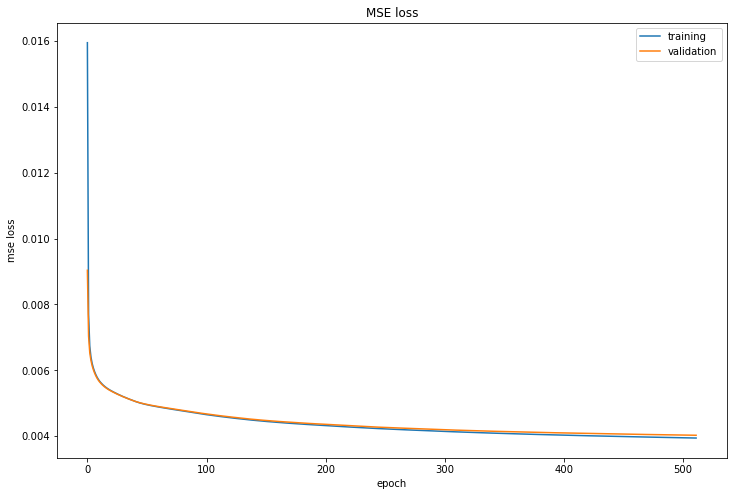

In [11]:
plt.figure(figsize=(12,8))
plt.plot(history.history['loss'], label='training')
plt.plot(history.history['val_loss'], label='validation')
plt.xlabel('epoch')
plt.ylabel('mse loss')
plt.legend()
plt.title('MSE loss')

In [12]:
class Analysis:
    def __init__(self):
        self.crop = 100
        self.fsize = 6
        self.histogram_bins = 40
        
    def wrap_phi(self, var):
        var = var%(2*np.pi)
        var = var - 2*np.pi*(var > np.pi)
        return var
        
    def predictions_vs_sample(self, compare, true, names, wrap_phi):
        plt.figure(figsize=(self.fsize*2, self.fsize*len(names)))
        for i in range(0, len(names)):
            compare_small = compare[:self.crop,i]
            true_small = true[:self.crop,i]
            if wrap_phi and "phi" in names[i]:
                compare_small = self.wrap_phi(compare_small)
                true_small = self.wrap_phi(true_small)
            plt.subplot(len(names), 1, i+1)
            plt.plot(range(0,self.crop), compare_small, 'bo', markersize=3, label = 'Predictions')
            plt.plot(range(0,self.crop), true_small, 'ro', markersize=3, label = 'True Value')
            ym, yM = plt.ylim()
            for x in range(self.crop):
                plt.vlines(x, color='g', linestyle='-', alpha=0.2, ymin= 
                            min(compare_small[x], true_small[x]), 
                            ymax= max(compare_small[x], true_small[x]))
            plt.hlines(np.mean(true[:,i]), xmin=-20, xmax=self.crop+20, alpha=0.5)
            MSE = 1/compare[:,i].size*np.sum((compare[:,i]- true[:,i])**2)
            plt.xlabel('Sample')
            plt.xlim(0, self.crop)
            plt.ylabel(names[i])
            plt.title(names[i] + " MSE: " + str(MSE))
            plt.legend()
    
    def display_errors(self, compare, true, names, wrap_phi):
        MSE = 1/compare.size*np.sum((compare- true)**2)
        print("total MSE: " + str(MSE))
        print(" ")
        for i in range(len(names)):
            diff = compare[:,i] -true[:,i]
            if wrap_phi and "phi" in names[i]:
                diff = self.wrap_phi(diff)
            MSE = 1/compare[:,i].size*np.sum((diff)**2)
            print("{0} MSE : ".format(names[i]), '%.10f'%MSE)
    
    def difference_histogram(self, compare, true, names, wrap_phi, bins):
        plt.figure(figsize=(self.fsize*2,self.fsize*len(names)))
        for i in range(len(names)):
            plt.subplot(len(names), 1, i+1)
            diff = true[:,i] - compare[:,i]
            hist0, bin_edges = np.histogram(true[:, i], bins=40)
            if bins[i] is None:
                hbins = bin_edges
            else:
                hbins = bins[i]
            plt.hist(diff, hbins, histtype='step', color='purple', label='true - predicted', density=True)
            plt.xlabel("Difference (Mean: {0}, Std: {1})".format(np.mean(diff), np.std(diff)))
            plt.title(names[i])
            plt.legend()
            plt.ylabel('Frequency')
            
    def variable_histogram(self, compare, true, names, wrap_phi, bins): 
        plt.figure(figsize=(self.fsize*2,self.fsize*len(names)))
        for i in range(len(names)):
            plt.subplot(len(names), 1, i+1)
            compare_small = compare[:, i]
            true_small = true[:, i]
            if wrap_phi and "phi" in names[i]:
                compare_small = self.wrap_phi(compare_small)
                true_small = self.wrap_phi(true_small)
            hist0, bin_edges = np.histogram(true[:, i], bins=40)
            
            if bins[i] is None:
                hbins = bin_edges
            else:
                hbins = bins[i]
                
            plt.hist(true_small, hbins, histtype='step', color='b', label='true values', density=False)
            plt.hist(compare_small, hbins, histtype='step', color='r', label='predictions', density=False)
            plt.xlabel(names[i])
            plt.title(names[i])
            plt.legend()
            plt.ylabel('Frequency')
    
    def difference_vs_variable(self, compare, true, names, wrap_phi):
        plt.figure(figsize=(self.fsize*2,self.fsize*len(names)))
        for i in range(len(names)):
            plt.subplot(len(names), 1, i+1)
            plt.plot(true[:, i], true[:, i]-compare[:, i], 'o', color='purple', label='True - Predicted', markersize=2)
            plt.xlabel('True ' + names[i])
            plt.legend()
            plt.ylabel('Difference')
    
    def predicted_vs_true(self, compare, true, names, wrap_phi):
        plt.figure(figsize=(self.fsize*2,self.fsize*len(names)))
        for i in range(len(names)):
            plt.subplot(len(names), 1, i+1)
            plt.plot(true[:, i], compare[:, i], 'o', color='g', markersize=2)
            line = np.linspace(np.min(true[:, i]), np.max(true[:, i]), 100)
            plt.plot(line, line, color='b')
            plt.xlabel('True')
            plt.title(names[i])
            plt.ylabel('Predicted')

In [13]:
display = Analysis()

predictions_unscaled = model.predict([testX_jets, testX_other])
true_unscaled = testY 

total_predictions = model.predict([np.append(trainX_jets,testX_jets,axis=0), np.append(trainX_other,testX_other,axis=0)])
(Y_total, TO_maxmean0), _ = Scaler.scale_arrays(Y_keys, Y_methods, True)

predictions_origscale = Scaler.invscale_arrays(Y_keys, total_predictions, _, Y_methods, TO_maxmean0)[split:,:]
true_origscale = Scaler.invscale_arrays(Y_keys, Y_total, _, Y_methods, TO_maxmean0)[split:,:]

del Y_total
del TO_maxmean0
del _
del total_predictions

# Training scale plots 

In [14]:
display.display_errors(predictions_unscaled, true_unscaled, Y_names, False)

total MSE: 0.0040259569284026705
 
th_ptbox MSE :  0.0025360342
th_px MSE :  0.0034054125
th_py MSE :  0.0056426873
th_eta MSE :  0.0090709581
tl_ptbox MSE :  0.0021598493
tl_px MSE :  0.0039279325
tl_py MSE :  0.0028620415
tl_eta MSE :  0.0065537092
wl_ptbox MSE :  0.0021365339
wl_px MSE :  0.0016404083
wl_py MSE :  0.0013801304
wl_eta MSE :  0.0069957860


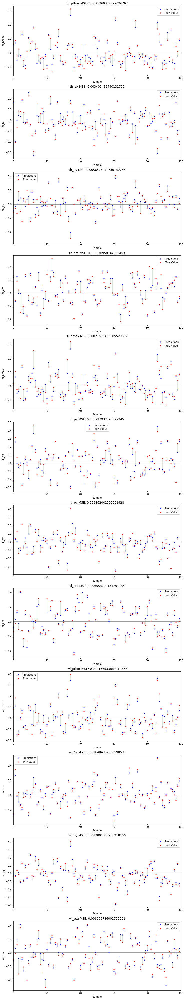

In [15]:
display.predictions_vs_sample(predictions_unscaled, true_unscaled, Y_names, False)

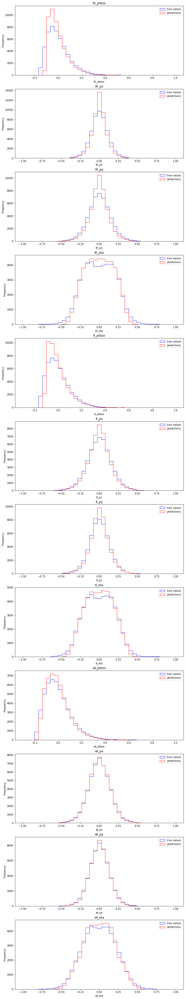

In [16]:
display.variable_histogram(predictions_unscaled, true_unscaled, Y_names, False, Y_bins)

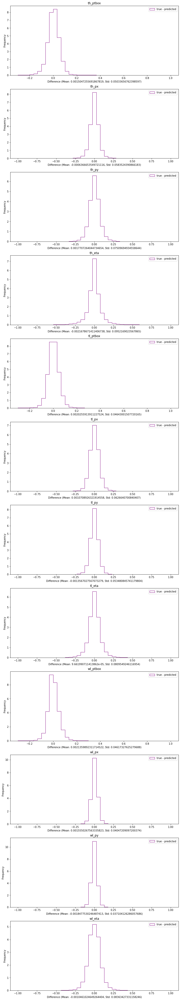

In [17]:
display.difference_histogram(predictions_unscaled, true_unscaled, Y_names, False, Y_bins)

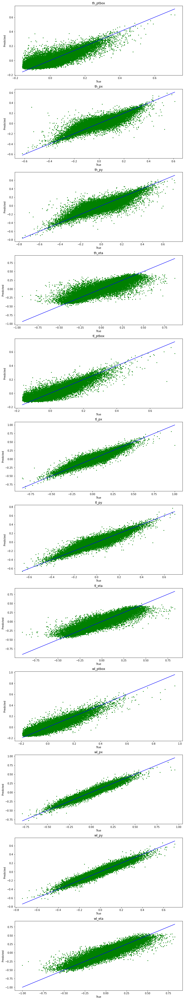

In [18]:
display.predicted_vs_true(predictions_unscaled, true_unscaled, Y_names, False)

 # Original scale plots

In [19]:
display.display_errors(predictions_origscale, true_origscale, Y_keys, True)

total MSE: 405.9116345497116
 
th_pt MSE :  1707.5684890671
th_eta MSE :  0.5380266112
th_phi MSE :  0.8474174471
tl_pt MSE :  1345.8837671312
tl_eta MSE :  0.4135973044
tl_phi MSE :  0.5385499045
wl_pt MSE :  591.9482208268
wl_eta MSE :  0.2922297374
wl_phi MSE :  0.1920906522


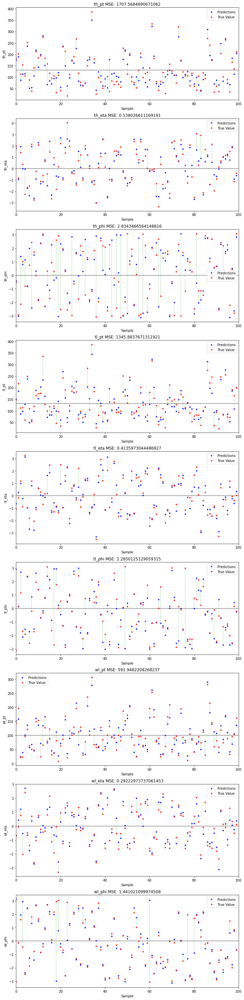

In [20]:
display.predictions_vs_sample(predictions_origscale, true_origscale, Y_keys, True)

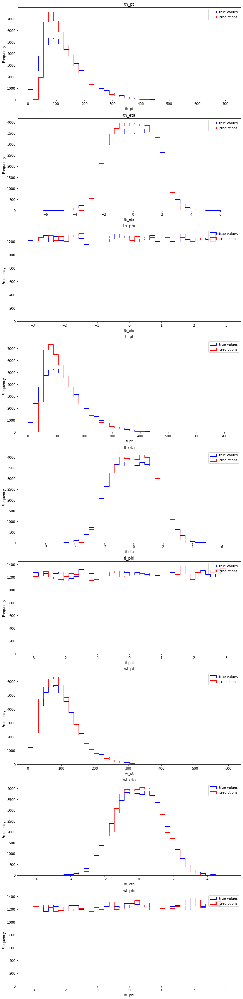

In [21]:
display.variable_histogram(predictions_origscale, true_origscale, Y_keys, True, [None for name in Y_names])

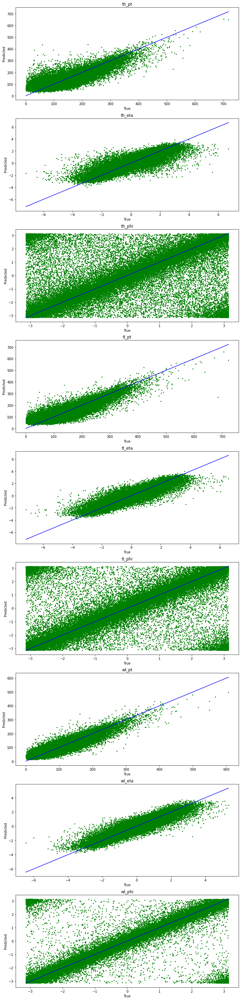

In [22]:
display.predicted_vs_true(predictions_origscale, true_origscale, Y_keys, True)

In [24]:
model.save('LSTMcart_parasearch.keras')